# Your Title Here

**Name(s)**: (your name(s) here)

**Website Link**: (your website link)

In [3]:
import pandas as pd
import numpy as np
from pathlib import Path

import plotly.express as px
pd.options.plotting.backend = 'plotly'

# from dsc80_utils import * # Feel free to uncomment and use this.

## Step 1: Introduction

# Introduction

Music streaming platforms like Spotify collect many types of information about songs, including both metadata and measurable audio features. In this project, I analyze the Spotify Music Tracks dataset, where each row represents one track and each column describes either information about the song or an audio characteristic of that song.

The main question I want to explore is: **Can Spotify audio features help explain or predict whether a track is explicit?** This question is interesting because explicitness is not just a random label; it may be connected to certain musical patterns, genres, and audio characteristics. For example, explicit tracks might differ from non-explicit tracks in energy, speechiness, loudness, or genre distribution.

This question is also relevant in the real world because streaming platforms use similar data to organize music, recommend songs, filter content, and understand listening behavior. By studying this dataset, I can investigate how measurable song features relate to a label that matters for both users and platforms.

The dataset contains 114,000 tracks and includes columns such as `track_name`, `artists`, `album_name`, `popularity`, `duration_ms`, `explicit`, `danceability`, `energy`, `loudness`, `speechiness`, `acousticness`, `instrumentalness`, `liveness`, `valence`, `tempo`, `time_signature`, and `track_genre`. The column `explicit` will be especially important because it tells whether a song is marked as explicit or non-explicit. Other audio feature columns, such as `energy`, `danceability`, `speechiness`, and `loudness`, will help me compare explicit and non-explicit tracks and later build a prediction model.


In [6]:
display(tracks.head())
display(tracks.shape)
display(tracks.columns)

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,release_date,explicit,danceability,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,1974,False,0.676,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,1995-04,False,0.420,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,1973,False,0.438,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,2018-08-10,False,0.266,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,2017-02-03,False,0.618,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,NaN,4,acoustic


(114000, 22)

Index(['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name',
       'popularity', 'duration_ms', 'release_date', 'explicit', 'danceability',
       'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'track_genre'],
      dtype='object')

## Step 2: Data Cleaning and Exploratory Data Analysis

In [7]:
tracks_clean = tracks.copy()

tracks_clean = tracks_clean.drop(columns=['Unnamed: 0'])

tracks_clean['explicit_label'] = tracks_clean['explicit'].map({
    True: 'Explicit',
    False: 'Non-explicit'
})

tracks_clean['duration_min'] = tracks_clean['duration_ms'] / 60000

tracks_clean.head()

,track_id,artists,album_name,track_name,popularity,duration_ms,release_date,explicit,danceability,energy,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,explicit_label,duration_min
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,1974,False,0.676,0.4610,...,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic,Non-explicit,3.844433
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,1995-04,False,0.420,0.1660,...,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic,Non-explicit,2.493500
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,1973,False,0.438,0.3590,...,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic,Non-explicit,3.513767
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,2018-08-10,False,0.266,0.0596,...,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic,Non-explicit,3.365550
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,2017-02-03,False,0.618,0.4430,...,0.0526,0.4690,0.000000,0.0829,0.167,NaN,4,acoustic,Non-explicit,3.314217


In [8]:
tracks_clean.shape

(114000, 23)

In [9]:
tracks_clean.isna().sum().sort_values(ascending=False)

tempo               22114
album_name              1
track_name              1
artists                 1
track_id                0
speechiness             0
explicit_label          0
track_genre             0
time_signature          0
valence                 0
liveness                0
instrumentalness        0
acousticness            0
loudness                0
mode                    0
key                     0
energy                  0
danceability            0
explicit                0
release_date            0
duration_ms             0
popularity              0
duration_min            0
dtype: int64

To clean the data, I first removed the `Unnamed: 0` column because it was just an unnecessary index column from the original CSV file. I also created an `explicit_label` column to make the values of `explicit` easier to interpret in visualizations, changing `True` to `"Explicit"` and `False` to `"Non-explicit"`. Finally, I created a `duration_min` column by converting `duration_ms` from milliseconds to minutes, since minutes are easier to interpret when describing song length.

In [10]:
explicit_summary = tracks_clean.groupby('explicit_label')[[
    'popularity',
    'energy',
    'danceability',
    'speechiness',
    'loudness',
    'valence',
    'tempo',
    'duration_min'
]].mean()

explicit_summary

,popularity,energy,danceability,speechiness,loudness,valence,tempo,duration_min
explicit_label,,,,,,,,
Explicit,36.454191,0.721139,0.636330,0.191139,-6.472891,0.471202,122.300883,3.418794
Non-explicit,32.937891,0.633926,0.560299,0.074696,-8.425947,0.474336,123.200208,3.836172


This table compares the average audio features of explicit and non-explicit tracks. Since my project focuses on whether audio features can help explain or predict explicitness, grouping by `explicit_label` gives an initial overview of how these two groups differ.

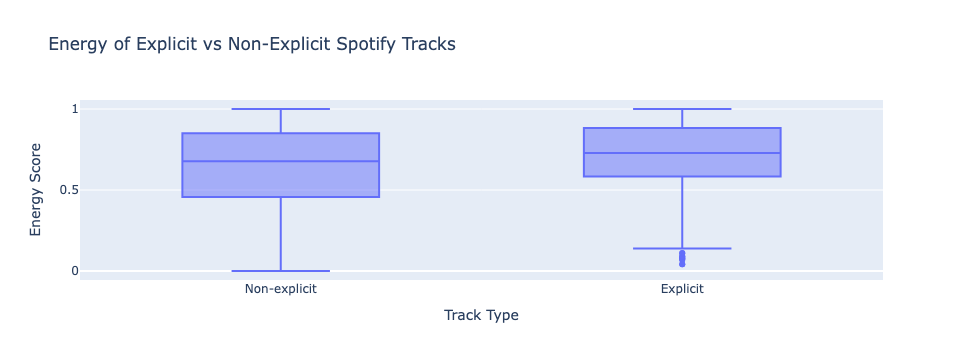

In [12]:
import plotly.express as px

fig = px.box(
    tracks_clean,
    x='explicit_label',
    y='energy',
    title='Energy of Explicit vs Non-Explicit Spotify Tracks',
    labels={
        'explicit_label': 'Track Type',
        'energy': 'Energy Score'
    }
)

fig.show()

This box plot compares the distribution of energy scores for explicit and non-explicit tracks. The explicit tracks appear to have a slightly higher median energy score than the non-explicit tracks, suggesting that explicit tracks may tend to be more intense or active. This connects directly to my hypothesis test, where I test whether explicit tracks have higher average energy than non-explicit tracks.

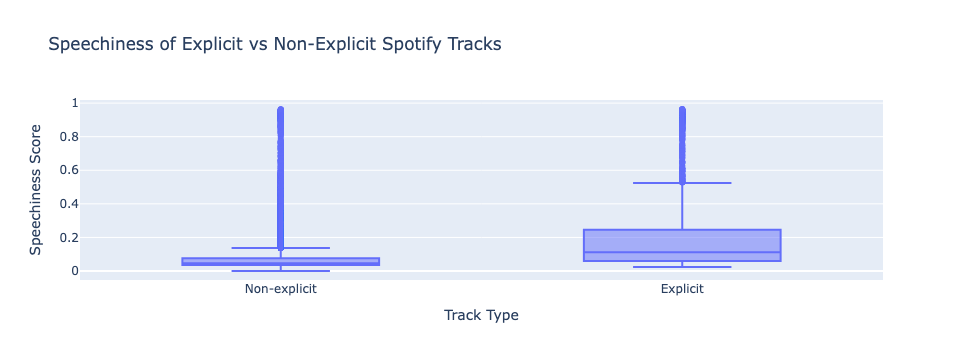

In [13]:
fig = px.box(
    tracks_clean,
    x='explicit_label',
    y='speechiness',
    title='Speechiness of Explicit vs Non-Explicit Spotify Tracks',
    labels={
        'explicit_label': 'Track Type',
        'speechiness': 'Speechiness Score'
    }
)

fig.show()

This box plot compares speechiness scores for explicit and non-explicit tracks. Speechiness measures the presence of spoken words in a track. If explicit tracks have higher speechiness values, this may suggest that explicitness is related to lyrical or spoken-word-heavy genres such as rap or hip-hop. This feature may be useful later in the prediction model.

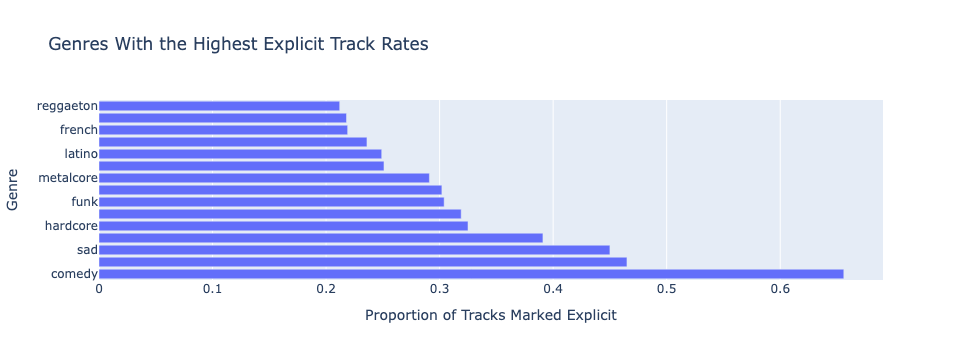

In [14]:
genre_explicit = (
    tracks_clean
    .groupby('track_genre')
    .agg(
        explicit_rate=('explicit', 'mean'),
        num_tracks=('explicit', 'size')
    )
    .reset_index()
)

top_genre_explicit = (
    genre_explicit[genre_explicit['num_tracks'] >= 500]
    .sort_values('explicit_rate', ascending=False)
    .head(15)
)

fig = px.bar(
    top_genre_explicit,
    x='explicit_rate',
    y='track_genre',
    orientation='h',
    title='Genres With the Highest Explicit Track Rates',
    labels={
        'explicit_rate': 'Proportion of Tracks Marked Explicit',
        'track_genre': 'Genre'
    }
)

fig.show()

This bar chart shows the genres with the highest proportion of explicit tracks, only including genres with at least 500 tracks to avoid unstable rates from very small groups. The visualization suggests that explicitness is strongly related to genre, which makes sense because some genres rely more heavily on lyrical content. This also suggests that `track_genre` may be an important feature in the prediction model.

## Step 3: Assessment of Missingness

In [15]:
tracks_clean.isna().sum().sort_values(ascending=False)

tempo               22114
album_name              1
track_name              1
artists                 1
track_id                0
speechiness             0
explicit_label          0
track_genre             0
time_signature          0
valence                 0
liveness                0
instrumentalness        0
acousticness            0
loudness                0
mode                    0
key                     0
energy                  0
danceability            0
explicit                0
release_date            0
duration_ms             0
popularity              0
duration_min            0
dtype: int64

The missing value check shows which columns contain missing values. Since most of the audio feature columns are complete, I focus on `track_name`, which has missing values and is interpretable in the context of the dataset.

In [16]:
tracks_clean['track_name_missing'] = tracks_clean['track_name'].isna()
tracks_clean['track_name_missing'].value_counts()

track_name_missing
False    113999
True          1
Name: count, dtype: int64

In [17]:
missing_popularity = tracks_clean.groupby('track_name_missing')['popularity'].mean()
missing_popularity

track_name_missing
False    33.238827
True      0.000000
Name: popularity, dtype: float64

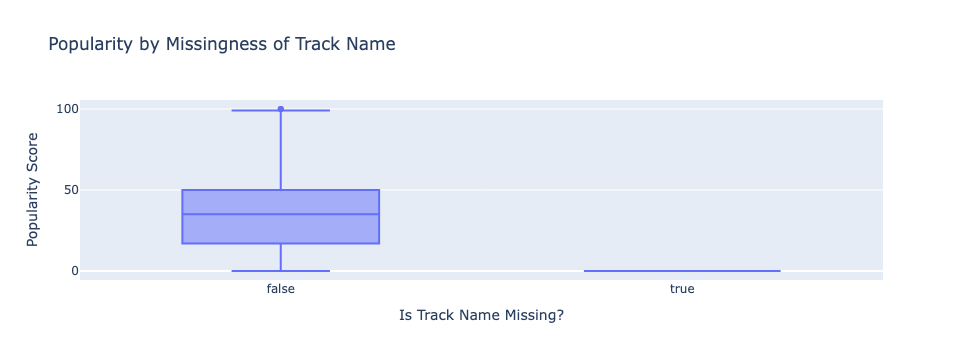

In [18]:
fig = px.box(
    tracks_clean,
    x='track_name_missing',
    y='popularity',
    title='Popularity by Missingness of Track Name',
    labels={
        'track_name_missing': 'Is Track Name Missing?',
        'popularity': 'Popularity Score'
    }
)

fig.show()

This plot compares the distribution of `popularity` for tracks with missing and non-missing `track_name` values. If the distributions look different, this suggests that the missingness of `track_name` may be related to `popularity`.

Hypothesis: I will test whether the missingness of `track_name` depends on `popularity`.

**Null Hypothesis:** The missingness of `track_name` does not depend on `popularity`. The popularity distribution is the same for rows where `track_name` is missing and rows where it is not missing.

**Alternative Hypothesis:** The missingness of `track_name` does depend on `popularity`. The popularity distribution is different for rows where `track_name` is missing and rows where it is not missing.

**Test Statistic:** The absolute difference in mean popularity between rows with missing `track_name` and rows with non-missing `track_name`.

In [22]:
obs = (
    tracks_clean
    .groupby('track_name_missing')['popularity']
    .mean()
    .diff()
    .abs()
    .iloc[-1]
)

obs

np.float64(33.23882665637418)

In [23]:
n_repetitions = 1000
diffs = []

for _ in range(n_repetitions):
    shuffled = tracks_clean['track_name_missing'].sample(
        frac=1,
        replace=False
    ).reset_index(drop=True)
    
    shuffled_df = tracks_clean[['popularity']].copy()
    shuffled_df['shuffled_missing'] = shuffled.values
    
    diff = (
        shuffled_df
        .groupby('shuffled_missing')['popularity']
        .mean()
        .diff()
        .abs()
        .iloc[-1]
    )
    
    diffs.append(diff)

p_value = np.mean(np.array(diffs) >= obs)

obs, p_value

(np.float64(33.23882665637418), np.float64(0.203))

The observed absolute difference in mean popularity was `[OBS]`, and the p-value was `[P-VALUE]`. Since the p-value is `[less/greater]` than 0.05, I `[reject/fail to reject]` the null hypothesis.

This suggests that the missingness of `track_name` `[does/does not]` appear to depend on `popularity`.

The missingness of `track_name` could potentially be NMAR if the reason a track name is missing is related to the track name itself. For example, some track names may contain unusual characters, formatting issues, or metadata problems that make them harder to store or process correctly. In that case, the missingness would depend on the unobserved value of `track_name` itself. However, it could also be MAR if the missingness is explained by another observed column, such as `popularity`, `track_genre`, or `artists`.

## Step 4: Hypothesis Testing

I want to test whether explicit tracks tend to have higher energy scores than non-explicit tracks.

**Null Hypothesis:** Explicit and non-explicit tracks come from the same distribution of energy scores. Any observed difference in average energy is due to random chance.

**Alternative Hypothesis:** Explicit tracks have higher energy scores on average than non-explicit tracks.

**Test Statistic:** Mean energy of explicit tracks minus mean energy of non-explicit tracks.

I use this test statistic because larger positive values support the alternative hypothesis. If explicit tracks are more energetic, then the mean energy of explicit tracks should be higher than the mean energy of non-explicit tracks.

In [25]:
hyp_df = tracks_clean[['explicit', 'energy']].dropna().copy()

hyp_df.head()

,explicit,energy
0,False,0.4610
1,False,0.1660
2,False,0.3590
3,False,0.0596
4,False,0.4430


In [26]:
observed_stat = (
    hyp_df.groupby('explicit')['energy'].mean().loc[True]
    - hyp_df.groupby('explicit')['energy'].mean().loc[False]
)

observed_stat

np.float64(0.0872131132983679)

In [27]:
n_repetitions = 1000
simulated_stats = []

for _ in range(n_repetitions):
    shuffled_explicit = hyp_df['explicit'].sample(
        frac=1,
        replace=False
    ).reset_index(drop=True)
    
    shuffled = hyp_df.copy()
    shuffled['shuffled_explicit'] = shuffled_explicit.values
    
    stat = (
        shuffled.groupby('shuffled_explicit')['energy'].mean().loc[True]
        - shuffled.groupby('shuffled_explicit')['energy'].mean().loc[False]
    )
    
    simulated_stats.append(stat)

p_value = np.mean(np.array(simulated_stats) >= observed_stat)

observed_stat, p_value

(np.float64(0.0872131132983679), np.float64(0.0))

In [28]:
np.array(simulated_stats) >= observed_stat

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

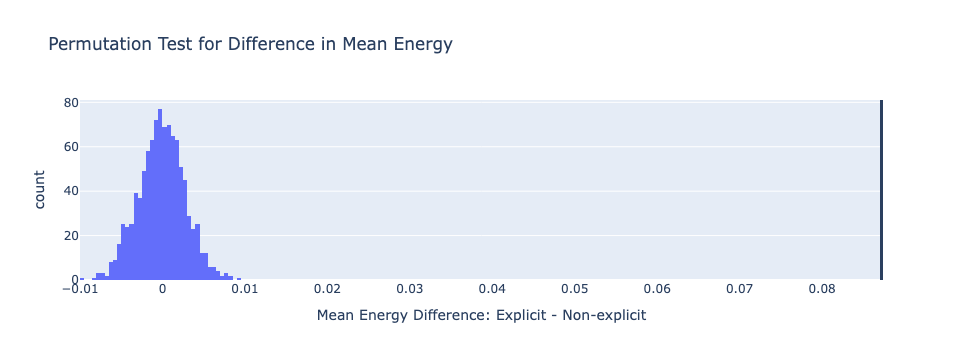

In [62]:
fig = px.histogram(
    x=simulated_stats,
    nbins=40,
    title='Permutation Test for Difference in Mean Energy',
    labels={'x': 'Mean Energy Difference: Explicit - Non-explicit'}
)

fig.add_vline(x=observed_stat, line_width=3)

fig.show()

### observed_stat, p_value

The observed test statistic was `0.0872131132983679`, meaning that explicit tracks had an average energy score about `0.0872` higher than non-explicit tracks. The p-value was `0.0`.

Since the p-value is `less` than 0.05, I `reject` the null hypothesis. This means there `is` statistically significant evidence that explicit tracks have higher energy scores on average than non-explicit tracks.

## Step 5: Framing a Prediction Problem

For my prediction problem, I plan to predict the `explicit` column. This column indicates whether a Spotify track is marked as explicit or non-explicit. Since there are only two possible outcomes, this is a binary classification problem.

The response variable is `explicit`. A value of `True` means the track is explicit, while a value of `False` means the track is non-explicit.

This prediction problem is useful because explicitness is an important label for music streaming platforms. Platforms may use this kind of information for content filtering, recommendations, playlist organization, and user preferences. I am interested in whether audio features such as `energy`, `danceability`, `speechiness`, `loudness`, `acousticness`, `valence`, and `tempo` can help predict whether a track is explicit.

I will evaluate my model using accuracy and F1-score. Accuracy measures the overall proportion of correct predictions, while F1-score is useful because the dataset may be imbalanced, with many more non-explicit tracks than explicit tracks. Since predicting explicit tracks correctly is important, F1-score gives a better sense of performance on the positive class than accuracy alone.

In [32]:
tracks_clean['explicit'].value_counts(normalize=True)

explicit
False    0.9145
True     0.0855
Name: proportion, dtype: float64

The class distribution shows that the dataset is imbalanced, so accuracy alone may be misleading. Because of this, I will use F1-score along with accuracy when evaluating my models.

## Step 6: Baseline Model

For my baseline model, I use a logistic regression classifier to predict whether a track is explicit. Since `explicit` is a binary variable, logistic regression is a reasonable simple baseline model.

I use four quantitative audio features: `energy`, `danceability`, `speechiness`, and `loudness`. These features are all numeric, so they can be used directly after standardization. I chose these features because they describe basic audio characteristics of a song and are relatively easy to interpret.

This baseline model only uses quantitative features and does not include categorical features such as `track_genre`. Because of this, I expect it to be limited, but it gives me a starting point for comparison with a more complex final model.

In [34]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report

In [35]:
baseline_features = ['energy', 'danceability', 'speechiness', 'loudness']

model_df = tracks_clean[baseline_features + ['explicit']].dropna()

X = model_df[baseline_features]
y = model_df['explicit']

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

In [36]:
baseline_model = Pipeline([
    ('scaler', StandardScaler()),
    ('classifier', LogisticRegression(max_iter=1000))
])

baseline_model.fit(X_train, y_train)

baseline_preds = baseline_model.predict(X_test)

In [37]:
baseline_accuracy = accuracy_score(y_test, baseline_preds)
baseline_f1 = f1_score(y_test, baseline_preds)

baseline_accuracy, baseline_f1

(0.9139035087719298, np.float64(0.11216644052464948))

In [38]:
print(classification_report(y_test, baseline_preds))

              precision    recall  f1-score   support

       False       0.92      0.99      0.95     20851
        True       0.47      0.06      0.11      1949

    accuracy                           0.91     22800
   macro avg       0.70      0.53      0.53     22800
weighted avg       0.88      0.91      0.88     22800



In [39]:
confusion_matrix(y_test, baseline_preds)

array([[20713,   138],
       [ 1825,   124]])

The baseline logistic regression model achieved an accuracy of 0.914 and an F1-score of 0.112 for the explicit class.

Although the accuracy is high, the classification report shows that the model performs poorly at identifying explicit tracks. The model has high recall for non-explicit tracks, but for explicit tracks it only has a recall of 0.06, meaning it misses most of the explicit songs. This happens because the dataset is imbalanced: most tracks are non-explicit, so the model can get high accuracy by mostly predicting the majority class.

The confusion matrix supports this. Out of 1,949 explicit tracks in the test set, the model correctly predicted only 124 of them as explicit and incorrectly predicted 1,825 of them as non-explicit. This means the baseline model is not strong enough for the main prediction task.

This baseline model only uses four quantitative audio features: `energy`, `danceability`, `speechiness`, and `loudness`. For the final model, I should improve it by adding more useful features such as `track_genre`, `duration_min`, `acousticness`, `instrumentalness`, `valence`, and `tempo`, and by using a more flexible classifier or class balancing.

## Step 7: Final Model

For my final model, I improve on the baseline model by adding more features and tuning the model. The baseline model only used four quantitative audio features, so it missed important information such as genre and other audio characteristics.

For the final model, I use both quantitative and categorical features. I add `track_genre` as a categorical feature because explicitness likely depends strongly on genre. I also add more numeric audio features, including `acousticness`, `instrumentalness`, `valence`, `tempo`, and `duration_min`. In addition, I create an engineered feature called `energy_speechiness`, which multiplies `energy` and `speechiness`. This feature may be useful because explicit tracks may be both energetic and lyric-heavy.

I use logistic regression again, but this time I tune the regularization strength `C` and whether the model uses balanced class weights. I use F1-score as the main metric because the dataset is imbalanced and the baseline model struggled to identify explicit tracks.

In [40]:
tracks_clean['energy_speechiness'] = tracks_clean['energy'] * tracks_clean['speechiness']

In [41]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import GridSearchCV

In [42]:
numeric_features = [
    'energy',
    'danceability',
    'speechiness',
    'loudness',
    'acousticness',
    'instrumentalness',
    'valence',
    'tempo',
    'duration_min',
    'energy_speechiness'
]

categorical_features = ['track_genre']

final_features = numeric_features + categorical_features

final_df = tracks_clean[final_features + ['explicit']].dropna()

X = final_df[final_features]
y = final_df['explicit']

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

In [43]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ]
)

In [44]:
final_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression(max_iter=1000))
])

param_grid = {
    'classifier__C': [0.1, 1, 10],
    'classifier__class_weight': [None, 'balanced']
}

grid_search = GridSearchCV(
    final_pipeline,
    param_grid=param_grid,
    scoring='f1',
    cv=3,
    n_jobs=-1
)

grid_search.fit(X_train, y_train)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         StandardScaler(),
                                                                         ['energy',
                                                                          'danceability',
                                                                          'speechiness',
                                                                          'loudness',
                                                                          'acousticness',
                                                                          'instrumentalness',
                                                                          'valence',
                                                                          'tempo',
                                                                          'duration_min',
                                                                          'energy_speechiness']),
                                                                        ('cat',
                                                                         OneHotEncoder(handle_unknown='ignore'),
                                                                         ['track_genre'])])),
                                       ('classifier',
                                        LogisticRegression(max_iter=1000))]),
             n_jobs=-1,
             param_grid={'classifier__C': [0.1, 1, 10],
                         'classifier__class_weight': [None, 'balanced']},
             scoring='f1')

In [45]:
grid_search.best_params_

{'classifier__C': 0.1, 'classifier__class_weight': 'balanced'}

In [46]:
final_model = grid_search.best_estimator_

final_preds = final_model.predict(X_test)

final_accuracy = accuracy_score(y_test, final_preds)
final_f1 = f1_score(y_test, final_preds)

final_accuracy, final_f1

(0.7722276635107194, np.float64(0.38765359859567))

In [47]:
print(classification_report(y_test, final_preds))

              precision    recall  f1-score   support

       False       0.98      0.77      0.86     16738
        True       0.26      0.81      0.39      1640

    accuracy                           0.77     18378
   macro avg       0.62      0.79      0.62     18378
weighted avg       0.91      0.77      0.82     18378



In [48]:
confusion_matrix(y_test, final_preds)

array([[12867,  3871],
       [  315,  1325]])

In [49]:
model_comparison = pd.DataFrame({
    'Model': ['Baseline Model', 'Final Model'],
    'Accuracy': [baseline_accuracy, final_accuracy],
    'F1 Score': [baseline_f1, final_f1]
})

model_comparison

,Model,Accuracy,F1 Score
0,Baseline Model,0.913904,0.112166
1,Final Model,0.772228,0.387654


The final model achieved an accuracy of 0.772 and an F1-score of 0.388 for the explicit class. Compared to the baseline model, which had an accuracy of 0.914 and an F1-score of 0.112, the final model has lower overall accuracy but much better performance on the explicit class.

The best parameters selected by GridSearchCV were `C = 0.1` and `class_weight = 'balanced'`. The balanced class weight helped because the dataset contains many more non-explicit tracks than explicit tracks.

The main improvement is recall for explicit tracks. In the baseline model, the recall for explicit tracks was only 0.06, meaning the model missed most explicit songs. In the final model, recall for explicit tracks increased to 0.81, meaning the model correctly identified most of the explicit tracks in the test set. The confusion matrix shows that the final model correctly predicted 1,325 explicit tracks and missed only 315 explicit tracks.

Overall, the final model is better for my prediction task because it is much more successful at identifying explicit tracks, even though it sacrifices some overall accuracy.

## Step 8: Fairness Analysis

For my fairness analysis, I compare the final model's performance on high-popularity tracks and low-popularity tracks. I define high-popularity tracks as tracks with popularity greater than or equal to the median popularity in the test set, and low-popularity tracks as tracks below the median.

I use recall for the explicit class as my evaluation metric. Recall measures the proportion of actually explicit tracks that the model correctly identifies as explicit. This metric is important because my baseline model had a high accuracy but missed most explicit tracks.

**Null Hypothesis:** The final model has the same recall for explicit tracks in the high-popularity and low-popularity groups. Any observed difference is due to random chance.

**Alternative Hypothesis:** The final model has different recall for explicit tracks in the high-popularity and low-popularity groups.

**Test Statistic:** The absolute difference in recall between the high-popularity and low-popularity groups.

In [52]:
fairness_df = pd.DataFrame({
    'actual': y_test,
    'predicted': final_preds,
    'popularity': tracks_clean.loc[X_test.index, 'popularity']
})

median_popularity = fairness_df['popularity'].median()

fairness_df['popularity_group'] = np.where(
    fairness_df['popularity'] >= median_popularity,
    'High popularity',
    'Low popularity'
)

fairness_df.head()

,actual,predicted,popularity,popularity_group
76394,False,False,23,Low popularity
47042,False,False,0,Low popularity
107708,False,False,53,High popularity
49843,True,True,20,Low popularity
24409,False,False,8,Low popularity


In [53]:
explicit_only = fairness_df[fairness_df['actual'] == True].copy()

group_recalls = explicit_only.groupby('popularity_group')['predicted'].mean()
group_recalls

popularity_group
High popularity    0.804651
Low popularity     0.811538
Name: predicted, dtype: float64

In [54]:
observed_diff = abs(
    group_recalls.loc['High popularity'] 
    - group_recalls.loc['Low popularity']
)

observed_diff

np.float64(0.006887298747763837)

In [55]:
n_repetitions = 1000
simulated_diffs = []

for _ in range(n_repetitions):
    shuffled_groups = explicit_only['popularity_group'].sample(
        frac=1,
        replace=False
    ).reset_index(drop=True)
    
    shuffled_df = explicit_only.copy()
    shuffled_df['shuffled_group'] = shuffled_groups.values
    
    shuffled_recalls = shuffled_df.groupby('shuffled_group')['predicted'].mean()
    
    diff = abs(
        shuffled_recalls.loc['High popularity']
        - shuffled_recalls.loc['Low popularity']
    )
    
    simulated_diffs.append(diff)

fairness_p_value = np.mean(np.array(simulated_diffs) >= observed_diff)

observed_diff, fairness_p_value

(np.float64(0.006887298747763837), np.float64(0.743))

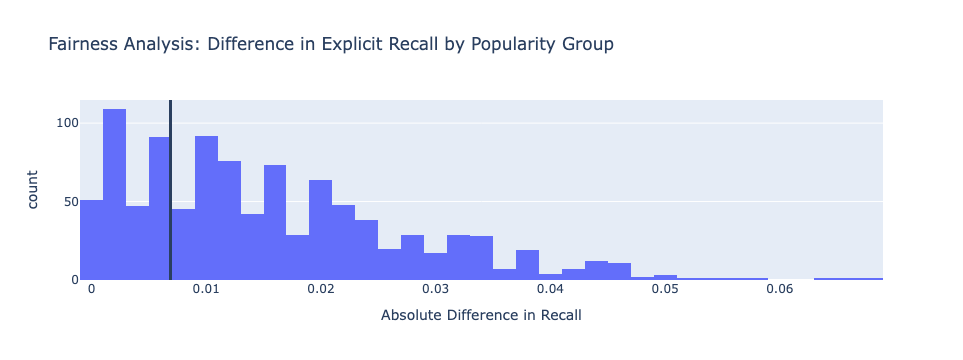

In [56]:
fig = px.histogram(
    x=simulated_diffs,
    nbins=40,
    title='Fairness Analysis: Difference in Explicit Recall by Popularity Group',
    labels={'x': 'Absolute Difference in Recall'}
)

fig.add_vline(x=observed_diff, line_width=3)

fig.show()

The final model had similar recall for explicit tracks across the two popularity groups. The recall was 0.805 for high-popularity tracks and 0.812 for low-popularity tracks. The observed absolute difference in recall was 0.0069, and the p-value was 0.743.

Since the p-value is greater than 0.05, I fail to reject the null hypothesis. This means there is not statistically significant evidence that the final model has different explicit-track recall for high-popularity and low-popularity songs.

In this fairness analysis, the model appears to perform similarly across the two popularity groups with respect to recall for explicit tracks.